**Pressione SHIFT+ENTER para executar a célula**

# Alegrete

Este notebook fornece algumas visualizações para o trabalho de regressão linear. Para conseguir usar, implemente as funções no seu `alegrete.py` e tenha as bibliotecas `numpy` e `matplotlib` instaladas.

O notebook usa um conjunto de dados sintetico. Adapte-o para carregar e usar os dados do `alegrete.csv`.

### Imports das bibliotecas de plot e da solucao implementada

In [26]:
%matplotlib inline
from IPython.display import HTML
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation

import alegrete

In [27]:
#FUNÇÃO DE NORMALIZAÇÃO

def feature_scaling(data):
    """
    Retorna os dados de "data" normalizados
    Utilizando "mean normalization":
    X' = (x - x_medio)/(x_maximo - x_minimo)
    """
    
    x = data[:,0]                                                         #Primeira coluna do parâmetro "data" é separada (X)
    y = data[:,1]                                                         #Segunda coluna do parâmetro "data" é separada (Y)
    size = data.shape[0]                                                  #Conta o tamanho de x e y
    
    x_max = np.max(x)                                                     #Valor máximo do banco de x
    y_max = np.max(y)                                                     #Valor máximo do banco de y
    
    x_min = np.min(x)                                                     #Valor mínimo do banco de x
    y_min = np.min(y)                                                     #Valor mínimo do banco de y
    
    x_gap = x_max - x_min                                                 #Calcula a diferença x_max - x_min
    y_gap = y_max - y_min                                                 #Calcula a diferença y_max - y_min
    
    x_average = np.divide(np.sum(x, axis=0), size)                        #Calcula o valor médio da coluna de x
    y_average = np.divide(np.sum(y, axis=0), size)                        #Calcula o valor médio da coluna de y
    
    data[:,0] = np.divide(x - x_average, x_gap)                           #Implementa a função de mean normalization para x
    data[:,1] = np.divide(y - y_average, y_gap)                           #Implementa a função de mean normalization para y
    
    return data                                                           #Retorna os dados normalizados

In [28]:
#FUNÇÕES DO ARQUIVO ALEGRETE.PY

def compute_mse(b, w, data):
    """
    Calcula o erro quadratico medio
    :param b: float - bias (intercepto da reta)
    :param w: float - peso (inclinacao da reta)
    :param data: np.array - matriz com o conjunto de dados, x na coluna 0 e y na coluna 1
    :return: float - o erro quadratico medio
    """
    x = data[:,0]                                                         #Primeira coluna do parâmetro "data" é separada (X)
    y = data[:,1]                                                         #Segunda coluna do parâmetro "data" é separada (Y)
    size = data.shape[0]                                                  #Conta a quantidade de combinações (x, y) na matriz
    y_prediction = w*x + b                                                #Substitui X na função de regressão linear para encontrar o Y predito pela função
    mse = np.divide(np.sum((y - y_prediction)**2, axis=0), size)          #Calcula a função de loss (somatório dos quadrados das difetenças de y por y predito dividido pelo número de pares (x,y))
    
    return mse                                                            #Retorna o valor float de loss


def step_gradient(b, w, data, alpha):
    """
    Executa uma atualização por descida do gradiente  e retorna os valores atualizados de b e w.
    :param b: float - bias (intercepto da reta)
    :param w: float - peso (inclinacao da reta)
    :param data: np.array - matriz com o conjunto de dados, x na coluna 0 e y na coluna 1
    :param alpha: float - taxa de aprendizado (a.k.a. tamanho do passo)
    :return: float,float - os novos valores de b e w, respectivamente
    """
    x = data[:,0]                                                   #Primeira coluna do parâmetro "data" é separada (X)
    y = data[:,1]                                                   #Segunda coluna do parâmetro "data" é separada (Y)
    size = data.shape[0]                                               #Conta a quantidade de combinações (x, y) na matriz
    partial_derivative_b = 0.0                                      #Derivada parcial em relação a B inicializada em 0
    partial_derivative_w = 0.0                                      #Derivada parcial em relação a B inicializada em 0
    
    for i, j in zip(x,y):                                           #Itera por x e y sob os rótulos i e j
        partial_derivative_b += -2*(j - (w*i + b))                  #Calcula a derivada parcial em relação a b para todos os x's e y's 
        partial_derivative_w += -2*(j - (w*i + b))*i                #Calcula a derivada parcial em relação a w para todos os x's e y's
        
    partial_derivative_b = partial_derivative_b/(size)                 #Média das derivadas parciais em relação a b
    partial_derivative_w = partial_derivative_w/(size)                 #Média das derivadas parciais em relação a w      
    w = w - partial_derivative_w*alpha                              #Gradiente descendente (multiplicando a derivada parcial pela taxa de aprendizado alfa)
    b = b - partial_derivative_b*alpha                              #Gradiente descendente (multiplicando a derivada parcial pela taxa de aprendizado alfa)
    
    return w, b
    


def fit(data, b, w, alpha, num_iterations):
    """
    Para cada época/iteração, executa uma atualização por descida de
    gradiente e registra os valores atualizados de b e w.
    Ao final, retorna duas listas, uma com os b e outra com os w
    obtidos ao longo da execução (o último valor das listas deve
    corresponder à última época/iteração).

    :param data: np.array - matriz com o conjunto de dados, x na coluna 0 e y na coluna 1
    :param b: float - bias (intercepto da reta)
    :param w: float - peso (inclinacao da reta)
    :param alpha: float - taxa de aprendizado (a.k.a. tamanho do passo)
    :param num_iterations: int - numero de épocas/iterações para executar a descida de gradiente
    :return: list,list - uma lista com os b e outra com os w obtidos ao longo da execução
    """
    list_b = [b]                                                    #Lista que deve ser retornada de todos os b's 
    list_w = [w]                                                    #Lista que deve ser retornada de todos os w's
    
    for epoch in range(num_iterations):                             #Itera num_interactions vezes
        w, b = step_gradient(b, w, data, alpha)                     #Chama a função de gradiente descendente e atualiza b e w
        list_b.append(b)                                            #Coloca o novo valor no final da lista de b's
        list_w.append(w)                                            #Coloca o novo valor no final da lista de w's
        
    return list_b, list_w                                           #Retorna as duas listas



### Visualizacao dos dados

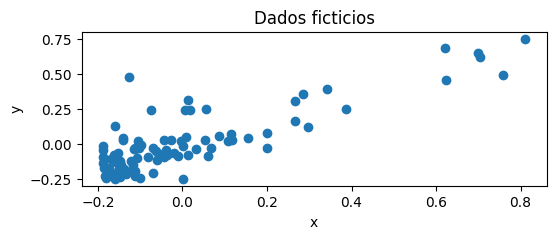

In [29]:
# carregamento do arquivo "alegrete.csv"

f = open("alegrete.csv", 'rb')
dataset = np.loadtxt(f, delimiter=",", dtype=float)
f.close


dataset = feature_scaling(dataset)          #   <----------FUNÇÃO DE NORMALIZAÇÃO DOS DADOS


#Gráfico dos dados
plt.figure(figsize=(6, 2))
plt.scatter(dataset[:,0], dataset[:,1])
plt.xlabel('x')
plt.ylabel('y')
plt.title('Dados ficticios')
plt.show()

### Execucao da regressao linear e calculo do EQM por epoca/iteracao

Considere o parâmetro b o coeficiente linear (theta_0, visto em aula) e w o coeficiente angular (theta_1, visto em aula).

EQM final: 0.014992103975467614


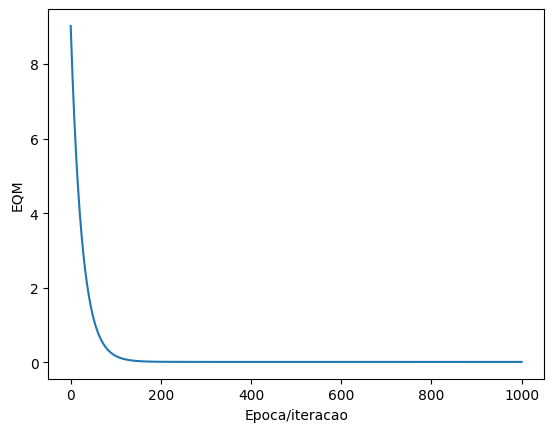

In [30]:
b_history, w_history = alegrete.fit(
    dataset, b=-3, w=1,
    alpha=0.01, num_iterations=1000
)

# valores finais de theta0 e theta1
final_b, final_w = b_history[-1], w_history[-1]

mse_list = [alegrete.compute_mse(b, w, dataset) for b, w in zip(b_history, w_history)]
print(f"EQM final: {mse_list[-1]}")


plt.plot(mse_list)
plt.xlabel('Epoca/iteracao')
plt.ylabel('EQM')
plt.show()

### Plot da curva final

Curva encontrada: 0.890946459465156*x + -5.0489020470416006e-09


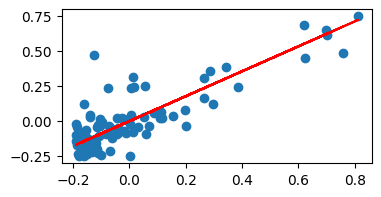

In [31]:
#Imprimir parâmetros otimizados
print (f'Curva encontrada: {final_w}*x + {final_b}')

#plota os dados
plt.figure(figsize=(4, 2))
plt.scatter(dataset[:,0], dataset[:,1])

# plota a curva de ajuste
pred = final_w*dataset[:,0] + final_b
plt.plot(dataset[:,0], pred, c='r')
plt.show()




### Progresso da descida do gradiente com o número de iterações

Execute a celula e use os controles abaixo do grafico para visualizar o progresso do seu ajuste

Pode aparecer um grafico "extra" abaixo da animacao, apenas ignore.

C:\Users\jooca\AppData\Local\Temp\ipykernel_32948\1673762163.py:18: UserWarning: You passed in an explicit save_count=50 which is being ignored in favor of frames=1001.
  ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=20, save_count=50)


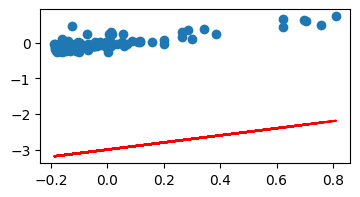

In [32]:
fig = plt.figure(figsize=(4, 2))
ax = fig.add_subplot(111)

# conjunto de dados
ax.scatter(dataset[:,0], dataset[:,1])

# linha com os valores iniciais dos parametros
pred = w_history[0]*dataset[:,0] + b_history[0]
line, = ax.plot(dataset[:,0], pred, '-',c='r')

# funcao que atualiza a linha a cada passo
def animate(i):
    pred = w_history[i] * dataset[:,0] + b_history[i]
    line.set_ydata(pred)
    return line,

# mude interval para trocar a velocidade da animacao
ani = animation.FuncAnimation(fig, animate, frames=len(b_history), interval=20, save_count=50)
HTML(ani.to_jshtml())